## 0. Libarary 불러오기 및 경로설정

In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
from PIL import Image
from pandas import DataFrame
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import torch.optim as optim

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split

from torchsummary import summary


from torchvision import transforms
from torchvision.transforms import Resize, ToTensor, Normalize
import torchvision.models as models
import torchvision.utils as vision_utils
import timm

from sklearn.model_selection import KFold, StratifiedKFold

import wandb

### Wandb configuration

In [2]:
!wandb login YOUR-API-KEY --relogin

wandb: Appending key for api.wandb.ai to your netrc file: /opt/ml/.netrc


In [3]:
# model 종류 : 'resnext50_32x4d','resnext101_32x8d','vit_base_patch16_224','vgg16','resnet152','resnet34','vit_large_patch16_224','custom_model'
img_size_x=[512,256,299]
img_size_y=[384,192,224]
wandb.init(project='img-classification-combined2', entity='zeus0007',config = {
    'learning_rate':0.001,
    'batch_size':16,
    'epoch':2,
    'model':'resnet152',
    'momentum':0.9,
    'img_x':img_size_x[2],
    'img_y':img_size_y[2],
    'kfold_num':3,
})
config = wandb.config

wandb: Currently logged in as: zeus0007 (use `wandb login --relogin` to force relogin)

CondaEnvException: Unable to determine environment

Please re-run this command with one of the following options:

* Provide an environment name via --name or -n
* Re-run this command inside an activated conda environment.



In [4]:
# 제목 생성
TITLE = f'm_{config.model}_sk{config.kfold_num}_e{config.epoch}_s{config.img_x}x{config.img_y}_b{config.batch_size}_l{config.learning_rate}_v1'

In [5]:
# Convert to GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [6]:
# 경로 설정
TRAIN_MASK_PATH = {'label':'../input/data/train/csvs/train.csv','images':'../input/data/train/images','new':'../input/data/train/csvs/new_train.csv'}
TEST_MASK_PATH = '../input/data/eval'

### 직접 설계한 custom model

In [7]:
# custom model
class Conv3x3BNReLU(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1, padding=1):
        super(Conv3x3BNReLU, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=padding)
        self.bn = nn.BatchNorm2d(out_channels)
        
    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        return F.relu(x, inplace=False)
    
class Conv1x1BNReLU(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Conv1x1BNReLU, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1)
        self.bn = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        return F.relu(x, inplace=False)

class MyModel(nn.Module):
    def __init__(self, num_classes: int = 1000):
        super(MyModel, self).__init__()
        
        self.Conv1_1 = Conv3x3BNReLU(in_channels=3, out_channels=32, stride=1, padding=1)
        self.Conv1_2 = Conv3x3BNReLU(in_channels=32, out_channels=64, stride=2)
        self.Block1 = nn.Sequential(
            Conv1x1BNReLU(64, 32),
            Conv3x3BNReLU(32, 64)
        )
        
        self.Conv2 = Conv3x3BNReLU(in_channels=64, out_channels=128, stride=2)
        self.Block2 = nn.Sequential(
            Conv1x1BNReLU(128, 64),
            Conv3x3BNReLU(64, 128)
        )
        
        self.Conv3 = Conv3x3BNReLU(in_channels=128, out_channels=256, stride=2)
        self.Block3 = nn.Sequential(
            Conv1x1BNReLU(256, 128),
            Conv3x3BNReLU(128, 256)
        )
        
        self.Conv4 = Conv3x3BNReLU(in_channels=256, out_channels=512, stride=2)
        self.Block4 = nn.Sequential(
            Conv1x1BNReLU(512, 256),
            Conv3x3BNReLU(256, 512)
        )
        
        self.Conv5 = Conv3x3BNReLU(in_channels=512, out_channels=1024, stride=2)
        self.Block5 = nn.Sequential(
            Conv1x1BNReLU(1024, 512),
            Conv3x3BNReLU(512, 1024)
        )        
        
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(1024, 1000),
            nn.ReLU(inplace=True),
            nn.Linear(1000, num_classes),
        )

    def forward(self, x):
        x = self.Conv1_1(x)
        x = self.Conv1_2(x)
        x_temp = x.clone()
        x = self.Block1(x)
        x += x_temp
        
        x = self.Conv2(x)
        for i in range(2):
            x_temp = x.clone()
            x = self.Block2(x)
            x += x_temp
        
        x = self.Conv3(x)
        for i in range(8):
            x_temp = x.clone()
            x = self.Block3(x)
            x += x_temp
        
        x = self.Conv4(x)
        for i in range(8):
            x_temp = x.clone()
            x = self.Block4(x)
            x += x_temp
        
        x = self.Conv5(x)
        for i in range(4):
            x_temp = x.clone()
            x = self.Block5(x)
            x += x_temp
        
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        
        return x
    
    def init_param(self):
        for m in self.modules():
            if isinstance(m,nn.Conv2d): # init conv
                nn.init.kaiming_normal_(m.weight)
                nn.init.zeros_(m.bias)
            elif isinstance(m,nn.BatchNorm2d): # init BN
                nn.init.constant_(m.weight,1)
                nn.init.constant_(m.bias,0)
            elif isinstance(m,nn.Linear): # lnit dense
                nn.init.kaiming_normal_(m.weight)
                nn.init.zeros_(m.bias)

### 원하는 모델을 불러온다

In [8]:
def config_model(model_name):
    pre_classified_models = ['vit_base_patch16_224','vgg16','vit_large_patch16_224','custom_model']
    if model_name in pre_classified_models:
        if model_name == 'vit_base_patch16_224':
            model = timm.create_model('vit_base_patch16_224',pretrained=True,num_classes=18).to(device)
        elif model_name == 'vgg16':
            model = models.vgg16(pretrained=True).to(device)
        elif model_name == 'vit_large_patch16_224':
            model = timm.create_model('vit_large_patch16_224',pretrained=True,num_classes=18).to(device)
        elif model_name == 'custom_model':
            model = MyModel(num_classes=18).to(device)
    else :
        if model_name == 'resnext50_32x4d':
            model = models.resnext50_32x4d(pretrained=True).to(device)
        elif model_name == 'resnext101_32x8d':
            model = models.resnext101_32x8d(pretrained=True).to(device)
        elif model_name == 'resnet152':
            model = models.resnet152(pretrained=True).to(device)
        elif model_name == 'resnet34':
            model = models.resnet34(pretrained=True).to(device) 
        num_features = model.fc.in_features
        model.fc = nn.Linear(num_features, 18).to(device)
    return model

### Data augmentation (transforms)

In [88]:
# for vit_base_patch16_224
import albumentations as A
from albumentations.pytorch import ToTensorV2
def transforms(train=True, img_size=(512, 384), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)):
    if train:
        transform = A.Compose([
            A.Resize(img_size[0], img_size[1], p=1.0),
            A.CenterCrop(224,224),
            A.HorizontalFlip(p=0.5),
            A.Normalize(mean=mean, std=std, max_pixel_value=255.0, p=1.0),
            ToTensorV2(p=1.0),
        ], p=1.0)
    else:
        transform = A.Compose([
            A.Resize(img_size[0], img_size[1]),
            A.CenterCrop(224,224),
            A.Normalize(mean=mean, std=std, max_pixel_value=255.0, p=1.0),
            ToTensorV2(p=1.0),
        ], p=1.0)
    return transform

### Dataset

In [89]:
class MaskDataset(Dataset):
    def __init__(self, df, index, train=True):
        data = df.iloc[index].reset_index(drop=True)
        image_path = data['Full Path']
        
        self.classified_labels = data['NewClass']
        self.images_full_path = image_path
        
        if train :
            self.transform =transforms(img_size = (config.img_x,config.img_y),train=True)
        else :
            self.transform = transforms(img_size = (config.img_x,config.img_y),train=False)
        
    def __len__(self):
        return self.images_full_path.shape[0]
    
    def __getitem__(self,idx):
        
        image_path = self.images_full_path[idx]
        image = Image.open(image_path)
        y = self.classified_labels[idx]
        
        X = self.transform(image=np.array(image))['image']
        return X,y

In [90]:
class MaskTestDataset(Dataset):
    def __init__(self, df):
        data = df.reset_index(drop=True)
        image_path = data['Full Path']
        self.classified_labels = data['NewClass']
        self.images_full_path = image_path
        self.transform = transforms(img_size = (config.img_x,config.img_y),train=False)
    
    def __len__(self):
        return self.images_full_path.shape[0]
    
    def __getitem__(self,idx):
        
        image_path = self.images_full_path[idx]
        image = Image.open(image_path)
        y = self.classified_labels[idx]
        
        X = self.transform(image=np.array(image))['image']
        return X,y

In [91]:
# data import & split data
df = pd.read_csv(TRAIN_MASK_PATH['new'])
test_length = len(df) - int(len(df)*0.2)
test_df = df.iloc[test_length:]
train_df = df.iloc[:test_length]

In [92]:
test_df

,Full Path,NewClass,-,Class Compare,Original Class,-.1,Mask,Gender,Age,-.2,ImageName,Gender.1,Age.1,ID
15120,/opt/ml/input/data/train/images/005445_female_...,10,NaN,True,10,NaN,1,1,1,NaN,incorrect_mask.jpg,female,53,5445
15121,/opt/ml/input/data/train/images/005445_female_...,4,NaN,True,4,NaN,0,1,1,NaN,mask1.jpg,female,53,5445
15122,/opt/ml/input/data/train/images/005445_female_...,4,NaN,True,4,NaN,0,1,1,NaN,mask2.jpg,female,53,5445
15123,/opt/ml/input/data/train/images/005445_female_...,4,NaN,True,4,NaN,0,1,1,NaN,mask3.jpg,female,53,5445
15124,/opt/ml/input/data/train/images/005445_female_...,4,NaN,True,4,NaN,0,1,1,NaN,mask4.jpg,female,53,5445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18895,/opt/ml/input/data/train/images/006959_male_As...,0,NaN,True,0,NaN,0,0,0,NaN,mask2.jpg,male,19,6959
18896,/opt/ml/input/data/train/images/006959_male_As...,0,NaN,True,0,NaN,0,0,0,NaN,mask3.jpg,male,19,6959
18897,/opt/ml/input/data/train/images/006959_male_As...,0,NaN,True,0,NaN,0,0,0,NaN,mask4.jpg,male,19,6959
18898,/opt/ml/input/data/train/images/006959_male_As...,0,NaN,True,0,NaN,0,0,0,NaN,mask5.jpg,male,19,6959


In [93]:
test_df

,Full Path,NewClass,-,Class Compare,Original Class,-.1,Mask,Gender,Age,-.2,ImageName,Gender.1,Age.1,ID
15120,/opt/ml/input/data/train/images/005445_female_...,10,NaN,True,10,NaN,1,1,1,NaN,incorrect_mask.jpg,female,53,5445
15121,/opt/ml/input/data/train/images/005445_female_...,4,NaN,True,4,NaN,0,1,1,NaN,mask1.jpg,female,53,5445
15122,/opt/ml/input/data/train/images/005445_female_...,4,NaN,True,4,NaN,0,1,1,NaN,mask2.jpg,female,53,5445
15123,/opt/ml/input/data/train/images/005445_female_...,4,NaN,True,4,NaN,0,1,1,NaN,mask3.jpg,female,53,5445
15124,/opt/ml/input/data/train/images/005445_female_...,4,NaN,True,4,NaN,0,1,1,NaN,mask4.jpg,female,53,5445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18895,/opt/ml/input/data/train/images/006959_male_As...,0,NaN,True,0,NaN,0,0,0,NaN,mask2.jpg,male,19,6959
18896,/opt/ml/input/data/train/images/006959_male_As...,0,NaN,True,0,NaN,0,0,0,NaN,mask3.jpg,male,19,6959
18897,/opt/ml/input/data/train/images/006959_male_As...,0,NaN,True,0,NaN,0,0,0,NaN,mask4.jpg,male,19,6959
18898,/opt/ml/input/data/train/images/006959_male_As...,0,NaN,True,0,NaN,0,0,0,NaN,mask5.jpg,male,19,6959


In [94]:
# test data settings
test_dataset = MaskTestDataset(test_df)
test_loader = DataLoader(
    test_dataset,
    shuffle=True
)

In [15]:
# test data settings
train_dataset = MaskTestDataset(train_df)
train_loader = DataLoader(
    train_dataset,
    shuffle=True
)

In [15]:
# kfold cross validation dataset
def create_kfold_datasets(df, fold_type = 'stratified_kfold', n_splits = 0):
    '''
        (fold_type) = 'kfold' or 'stratified_kfold' -> (string)
        (n_splits) = 0 -> (int)
    '''
    if fold_type == 'kfold':
        kfold = KFold(n_splits=n_splits, shuffle=True)
        def fold_dataset():
            for train_index, val_index in kfold.split(df):
                train_dataset = MaskDataset(df, train_index, train=True)
                val_dataset = MaskDataset(df, val_index, train=False)
                yield train_dataset, val_dataset
        fold_datasets = fold_dataset()
        return fold_datasets
    elif fold_type == 'stratified_kfold':
        kfold = StratifiedKFold(n_splits=n_splits, shuffle=True)
        kfold_label = df['NewClass']
        def fold_dataset():
            for train_index, val_index in kfold.split(df, kfold_label):
                train_dataset = MaskDataset(df, train_index, train=True)
                val_dataset = MaskDataset(df, val_index, train=False)
                yield train_dataset, val_dataset
        fold_datasets = fold_dataset()
        return fold_datasets
        
    else : 
        print("Fold type error : Use 'kfold' or 'stratified_kfold' ")
#         raise

# 자동화시에 주석
fold_datasets = create_kfold_datasets(train_df, 'stratified_kfold', config.kfold_num)

In [16]:
def train_model(model, criterion, optimizer,fold_datasets, num_epochs=1,):
    
    for i, (train_dataset, val_dataset) in enumerate(fold_datasets):
        print(f'k-fold : {i+1}')
        print('-' * 10)
        image_datasets = {'train':train_dataset,'validation':val_dataset}
        train_loader = DataLoader(
            train_dataset,
            batch_size=config.batch_size,
            num_workers=4,
            shuffle=True
        )
        val_loader = DataLoader(
            val_dataset,
            batch_size=config.batch_size,
            num_workers=4,
            shuffle=True
        )
        dataloaders = {'train':train_loader, 'validation':val_loader}
        for epoch in range(num_epochs):
            print('Epoch {}/{}'.format(epoch+1, num_epochs))
            print('-' * 10)

            for phase in ['train', 'validation']:
                if phase == 'train':
                    model.train()
                else:
                    model.eval()

                running_loss = 0.0
                running_corrects = 0

                for inputs, labels in tqdm(dataloaders[phase]):
                    inputs = inputs.to(device)
                    labels = labels.to(device)

                    outputs = model(inputs)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        optimizer.zero_grad()
                        loss.backward()
                        optimizer.step()

                    _, preds = torch.max(outputs, 1)
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)

                epoch_loss = running_loss / len(image_datasets[phase])
                epoch_acc = running_corrects.double() / len(image_datasets[phase])
                wandb.log({f"{phase}_acc":epoch_acc, f"{phase}_loss":epoch_loss})
                print('{} loss: {:.4f}, acc: {:.4f}'.format(phase,
                                                            epoch_loss,
                                                            epoch_acc))
    return model

In [79]:
def test_model(model,test_dataset,test_loader):
    
    model.eval()

    running_loss = 0.0
    running_corrects = 0

    for inputs, labels in tqdm(test_loader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        _, preds = torch.max(outputs, 1)
        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

    test_loss = running_loss / len(test_dataset)
    test_acc = running_corrects.double() / len(test_dataset)
    print('test loss: {:.4f}, acc: {:.4f}'.format(test_loss,test_acc))
    wandb.log({f"test_acc":test_acc, f"test_loss":test_loss})
    print('test_done')

### Run the model

In [19]:
#모델 정의
model_list = ['resnet152', 'custom_model', 'vit_base_patch16_224']

for model_name in model_list:
    
    wandb.init(project='img-classification-combined2', entity='zeus0007')
    
    model = config_model(model_name)
    #Hyper parameter 가져오기
    lr = config.learning_rate
    criterion = torch.nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=lr, momentum=config.momentum)

    #모델 학습
    fold_datasets = create_kfold_datasets(train_df, 'stratified_kfold', config.kfold_num)
    model = train_model(model, criterion, optimizer, fold_datasets, num_epochs=config.epoch)
    model.eval()
    
    print('---------------------------------------------------------------------------')
    print(f'testing model: {model_name}')
    test_model(model,test_dataset,test_loader)
    print('---------------------------------------------------------------------------')
    
    print('saving model')
    torch.save(model.state_dict(), f'/opt/ml/code/model/{model_name}.pth')
    print('model saved')
    
    print('done')

test_acc,0.10026
test_loss,3.09701
_runtime,95
_timestamp,1630675834
_step,0


test_acc,▁
test_loss,▁
_runtime,▁
_timestamp,▁
_step,▁



CondaEnvException: Unable to determine environment

Please re-run this command with one of the following options:

* Provide an environment name via --name or -n
* Re-run this command inside an activated conda environment.



k-fold : 1
----------
Epoch 1/2
----------



train loss: 0.7809, acc: 0.7458



validation loss: 0.3844, acc: 0.8692
Epoch 2/2
----------



train loss: 0.2689, acc: 0.9085



validation loss: 0.2324, acc: 0.9198
k-fold : 2
----------
Epoch 1/2
----------



train loss: 0.1873, acc: 0.9392



validation loss: 0.1142, acc: 0.9581
Epoch 2/2
----------



train loss: 0.0969, acc: 0.9711



validation loss: 0.0691, acc: 0.9784
k-fold : 3
----------
Epoch 1/2
----------



train loss: 0.0780, acc: 0.9768



validation loss: 0.0247, acc: 0.9929
Epoch 2/2
----------



train loss: 0.0427, acc: 0.9889



validation loss: 0.0110, acc: 0.9976
---------------------------------------------------------------------------
testing model: resnet152



test loss: 0.3064, acc: 0.9164
test_done
---------------------------------------------------------------------------
saving model
model saved
done


train_acc,0.98889
train_loss,0.04268
_runtime,887
_timestamp,1630676757
_step,12
validation_acc,0.99762
validation_loss,0.01098
test_acc,0.9164
test_loss,0.30644


train_acc,▁▆▇▇██
train_loss,█▃▂▂▁▁
_runtime,▁▁▂▂▃▃▄▄▅▅▆▇█
_timestamp,▁▁▂▂▃▃▄▄▅▅▆▇█
_step,▁▂▂▃▃▄▅▅▆▆▇▇█
validation_acc,▁▄▆▇██
validation_loss,█▅▃▂▁▁
test_acc,▁
test_loss,▁



CondaEnvException: Unable to determine environment

Please re-run this command with one of the following options:

* Provide an environment name via --name or -n
* Re-run this command inside an activated conda environment.



k-fold : 1
----------
Epoch 1/2
----------



train loss: 2.0522, acc: 0.3377



validation loss: 3.3221, acc: 0.1089
Epoch 2/2
----------



train loss: 1.1830, acc: 0.5885



validation loss: 3.2031, acc: 0.1788
k-fold : 2
----------
Epoch 1/2
----------



train loss: 0.8742, acc: 0.6887



validation loss: 3.2510, acc: 0.1788
Epoch 2/2
----------



train loss: 0.7068, acc: 0.7403



validation loss: 2.7989, acc: 0.1236
k-fold : 3
----------
Epoch 1/2
----------



train loss: 0.6166, acc: 0.7762



validation loss: 2.3855, acc: 0.2323
Epoch 2/2
----------



train loss: 0.5179, acc: 0.8094



validation loss: 2.6374, acc: 0.1137
---------------------------------------------------------------------------
testing model: custom_model



test loss: 3.3818, acc: 0.0251
test_done
---------------------------------------------------------------------------
saving model
model saved
done


train_acc,0.80942
train_loss,0.51788
_runtime,490
_timestamp,1630677251
_step,12
validation_acc,0.11369
validation_loss,2.6374
test_acc,0.02513
test_loss,3.3818


train_acc,▁▅▆▇██
train_loss,█▄▃▂▁▁
_runtime,▁▁▂▂▃▃▄▄▅▆▆▇█
_timestamp,▁▁▂▂▃▃▄▄▅▆▆▇█
_step,▁▂▂▃▃▄▅▅▆▆▇▇█
validation_acc,▁▅▅▂█▁
validation_loss,█▇▇▄▁▃
test_acc,▁
test_loss,▁



CondaEnvException: Unable to determine environment

Please re-run this command with one of the following options:

* Provide an environment name via --name or -n
* Re-run this command inside an activated conda environment.



k-fold : 1
----------
Epoch 1/2
----------



train loss: 0.6457, acc: 0.7902



validation loss: 0.3198, acc: 0.8909
Epoch 2/2
----------



train loss: 0.1890, acc: 0.9311



validation loss: 0.2438, acc: 0.9093
k-fold : 2
----------
Epoch 1/2
----------



train loss: 0.1373, acc: 0.9524



validation loss: 0.1015, acc: 0.9603
Epoch 2/2
----------



train loss: 0.0768, acc: 0.9727



validation loss: 0.1084, acc: 0.9694
k-fold : 3
----------
Epoch 1/2
----------



train loss: 0.0611, acc: 0.9802



validation loss: 0.1000, acc: 0.9655
Epoch 2/2
----------



train loss: 0.0316, acc: 0.9901



validation loss: 0.0088, acc: 0.9974
---------------------------------------------------------------------------
testing model: vit_base_patch16_224



test loss: 0.5626, acc: 0.8958
test_done
---------------------------------------------------------------------------
saving model
model saved
done


In [85]:
# 동일 파일명 존재 여부 체크 & 모델 저장
# while True :
#     isfile = os.path.isfile('/opt/ml/code/model/{TITLE}.pth')
#     if isfile:
#         TITLE = TITLE[:len(TITLE)-2]+str(int(TITLE[len(TITLE)-1])+1)
#     else :
#         break
# torch.save(model.state_dict(), f'/opt/ml/code/model/{TITLE}.pth')
# print('done')

FileNotFoundError: [Errno 2] No such file or directory: '/opt/ml/code/model/m_resnet152_sk3_e2_s299x224_b16_l0.001_v1.pth'

In [86]:
# 모델 테스트
# test_model(model,test_dataset,test_loader)


test loss: 0.3600, acc: 0.9212
test_done


In [87]:
class TestDataset(Dataset):
    def __init__(self, img_paths, transform):
        self.img_paths = img_paths
        self.transform = transform

    def __getitem__(self, index):
        image = Image.open(self.img_paths[index])

        if self.transform:
            image = self.transform(image=np.array(image))['image']
        return image

    def __len__(self):
        return len(self.img_paths)

In [88]:
# test dataset settings
from torchvision import transforms as simple_transforms

test_dir = '/opt/ml/input/data/eval'
submission = pd.read_csv(os.path.join(test_dir, 'info.csv'))
image_dir = os.path.join(test_dir, 'images')

image_paths = [os.path.join(image_dir, img_id) for img_id in submission.ImageID]
transform = A.Compose([
            A.Resize(config.img_x, config.img_y),
            A.CenterCrop(224,224),
            A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5), max_pixel_value=255.0, p=1.0),
            ToTensorV2(p=1.0),
        ], p=1.0)

dataset = TestDataset(image_paths, transform)

loader = DataLoader(
    dataset,
    shuffle=False
)

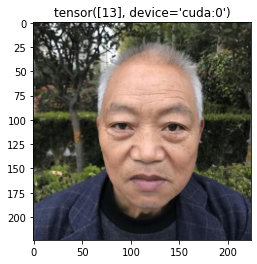

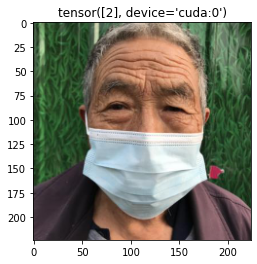

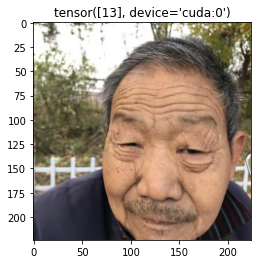

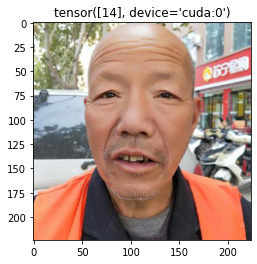

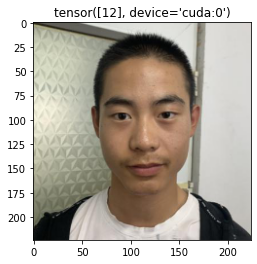

...

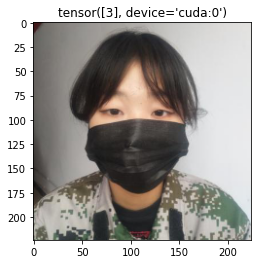

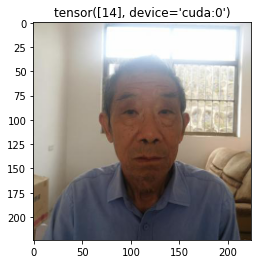

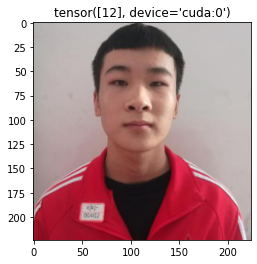

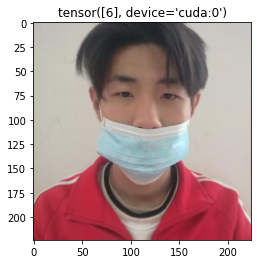

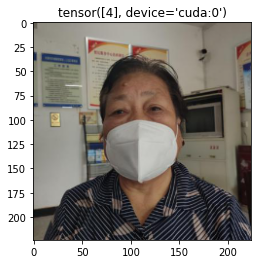

In [89]:
# 결과 예측 이미지 생성
import torchvision.utils as vision_utils

mean=(0.5, 0.5, 0.5)
std=(0.5, 0.5, 0.5)

def imshow(input, title):
    input = input.numpy().transpose((1, 2, 0))
    input = std * input + mean
    input = np.clip(input, 0, 1)

    plt.imshow(input)
    plt.title(title)
    plt.show()
    
# Test gender model
model.eval()
class_names = [0, 1]

with torch.no_grad():
    running_loss = 0.
    running_corrects = 0

    for i, inputs in enumerate(loader):
        inputs = inputs.to(device)

        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        images = vision_utils.make_grid(inputs)
        imshow(images.cpu(), title=preds)
            
        if i == 200:
            break

In [90]:
# 결과 예측

all_predictions = []

for images in tqdm(loader):
    with torch.no_grad():
        images = images.to(device)
        pred = model(images)
        pred = pred.argmax(dim=-1)
        all_predictions.extend(pred.cpu().numpy())
submission['ans'] = all_predictions

# 제출할 파일을 저장합니다.
submission.to_csv(os.path.join(test_dir, f'submission_{TITLE}.csv'), index=False)
print('test inference is done!')


test inference is done!
